<a href="https://colab.research.google.com/github/Vangzbill/PCVK_Ganjil_2023/blob/main/Week5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Pengolahan Citra dan Visi Komputer – Jurusan Teknologi Informasi**

---

Nama      : Sabilla Luthfi Rahmadhan

No Absen  : 19

Kelas     : TI-3G
***

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import cv2 as cv
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt

**PRAKTIKUM**

**1. Buat Gamma Correction sesuai dengan petunjuk berikut**

Percobaan ini akan meminta anda membuat Gamma Correction. Pada percobaan ini, nilai Gamma akan diset dengan meminta masukan dari pengguna. Berikut adalah kode untuk meminta masukan nilai dari pengguna. Lanjutkan kode tersebut dengan membuat image dengan gamma correction sesuai rumus yang telah diberikan.

 Gamma Correction pada Citra 
----------------------------------
Masukkan nilai Gamma: 3


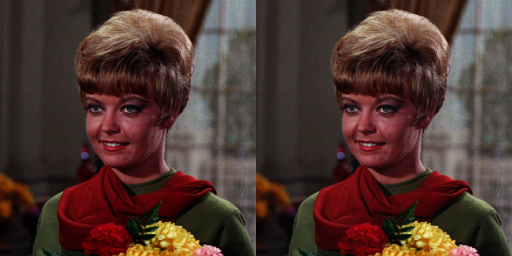

In [4]:
print(' Gamma Correction pada Citra ')
print('----------------------------------')
try:
  gamma = int(input('Masukkan nilai Gamma: '))
except ValueError:
  print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/PCVK/Images/female.tiff')
gamma_img = np.zeros(original.shape, original.dtype)

gamma_img = cv.convertScaleAbs(original, beta=gamma)   # alpha untuk mengontrol faktor scalling

final_frame = cv.hconcat((original, gamma_img))
cv2_imshow(final_frame)


**2. Buat Simulasi Image Depth**

Percobaan ini digunakan sebagai simulasi dari proses kuantisasi citra. Pada kuantisasi citra, pixel dapat direpresentasikan dengan n-bit kedalaman (default menggunakan 8-bit). Pada pixel 8-bit, warna yang memungkinkan adalah 256 warna, dari 0 (0000 0000) hingga 255(1111 1111). Pada pixel 7-bit, warna yang memungkinkan adalah 128 warna, dari 0 (000 0000) hingga 127 (111 1111). Kemungkinan warna didapat dari pangkat 2 jumlah bit. Jika 7bit, maka jumlah warnanya adalah 27 = 128, dst.

Berikut adalah kode untuk membaca citra masukan dan memberi nilai kedalaman citra, silahkan lanjutkan kode program berikut sehingga menghasilkan keluaran seperti contoh pada Gambar.

 Simulasi Image Depth pada Citra 
----------------------------------
Masukkan nilai Depth: 2


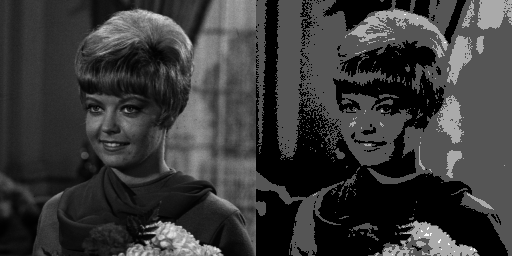

In [6]:
print(' Simulasi Image Depth pada Citra ')
print('----------------------------------')
try:
  bit_depth = int(input('Masukkan nilai Depth: '))
except ValueError:
  print('Error, not a number')

level = 255 / (pow(2,bit_depth)-1)

original = cv.imread('/content/drive/MyDrive/PCVK/Images/female.tiff', cv.IMREAD_GRAYSCALE)
depth_img = np.zeros(original.shape, original.dtype)

# melakukan akses setiap piksel pada grayscale
for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    depth_img[y,x] = np.clip(round(original[y,x] / level)*level,0,255)

final_frame = cv.hconcat((original, depth_img))
cv2_imshow(final_frame)

**3. Buat modul Average Denoising**

Buat modul average denoising sesuai dengan rumus yang telah diberikan pada sub bab sebelumnya.
Citra asli sudah disediakan pada /images/galaxy.jpg.
100 Citra dengan Gaussian Noise sudah disediakan pada /images/noises/*.jpg
Anda dapat menggunakan code berikut untuk membaca semua image dalam satu folder , gunakan modul glob (import glob).

In [7]:
import glob
# membaca citra asli
original_img = cv.imread('/content/drive/MyDrive/PCVK/Images/galaxy.jpg')

# membaca semua citra yang tersimpan dalam satu folder
cv_img = []
for img in glob.glob('/content/drive/MyDrive/PCVK/Images/noises/*.jpg'):
  n = cv.imread(img)
  cv_img.append(n)

In [8]:
import cv2
from math import sqrt, log10

def PSNR(img1, img2):
  mse = np.mean((img1-img2)**2)
  if(mse==0):
    return 100
  max_pixel = 255.0
  psnr = 20 * log10(max_pixel / sqrt(mse))
  return psnr

Nilai PSNR dengan 5 citra :  19.51449656918473  dB


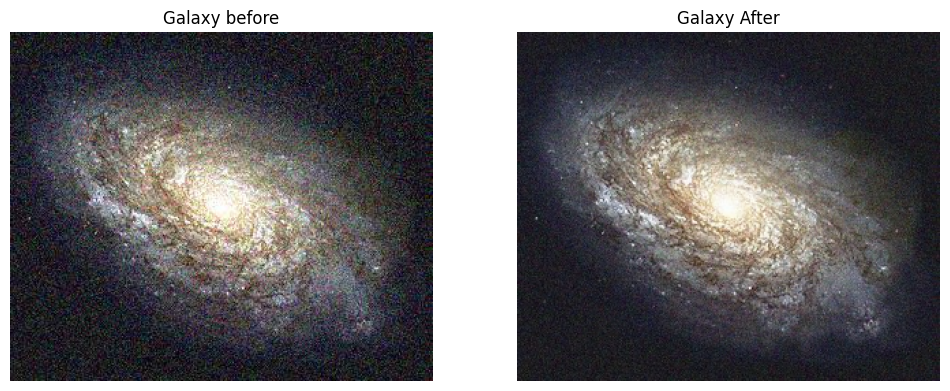

In [9]:
denoised_img = np.zeros(cv_img[0].shape)
jmlGambar = 5
for i in range(jmlGambar):
  denoised_img = denoised_img + cv_img[i]
denoised_img = np.uint16(denoised_img/jmlGambar)

psnr = PSNR(original_img,denoised_img)

print('Nilai PSNR dengan 5 citra : ', psnr, ' dB')
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(cv_img[0], cv2.COLOR_BGR2RGB))
plt.title('Galaxy before')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(denoised_img, cv2.COLOR_BGR2RGB))
plt.title('Galaxy After')
plt.axis('off')

plt.show()

Nilai PSNR dengan 30 citra :  19.87582578046821  dB


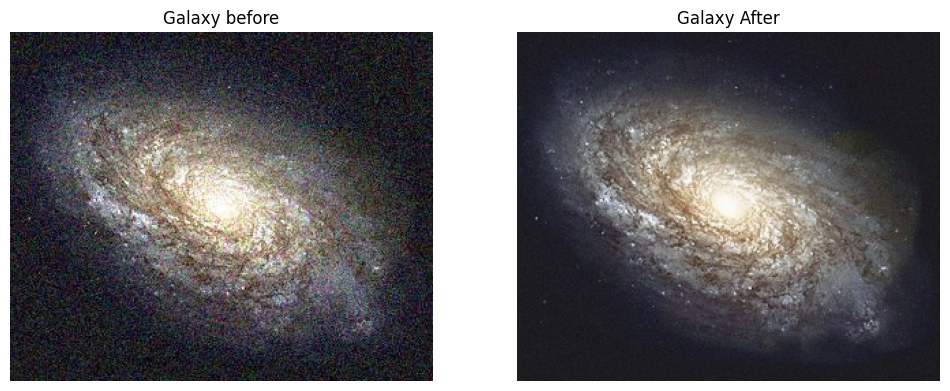

In [11]:
denoised_img = np.zeros(cv_img[0].shape)
jmlGambar = 30
for i in range(jmlGambar):
  denoised_img = denoised_img + cv_img[i]
denoised_img = np.uint16(denoised_img/jmlGambar)

psnr = PSNR(original_img,denoised_img)

print('Nilai PSNR dengan 30 citra : ', psnr, ' dB')
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(cv_img[0], cv2.COLOR_BGR2RGB))
plt.title('Galaxy before')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(denoised_img, cv2.COLOR_BGR2RGB))
plt.title('Galaxy After')
plt.axis('off')

plt.show()

Nilai PSNR dengan 60 citra :  19.90910212848738  dB


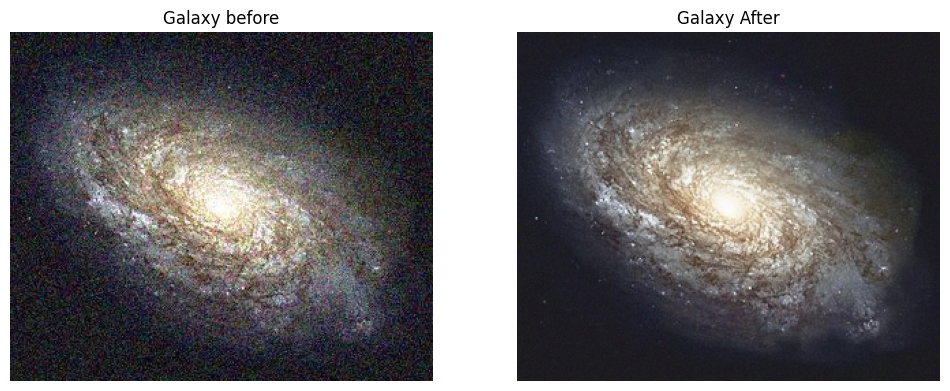

In [12]:
denoised_img = np.zeros(cv_img[0].shape)
jmlGambar = 60
for i in range(jmlGambar):
  denoised_img = denoised_img + cv_img[i]
denoised_img = np.uint16(denoised_img/jmlGambar)

psnr = PSNR(original_img,denoised_img)

print('Nilai PSNR dengan 60 citra : ', psnr, ' dB')
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(cv_img[0], cv2.COLOR_BGR2RGB))
plt.title('Galaxy before')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(denoised_img, cv2.COLOR_BGR2RGB))
plt.title('Galaxy After')
plt.axis('off')

plt.show()

Nilai PSNR dengan 80 citra :  19.916559637542758  dB


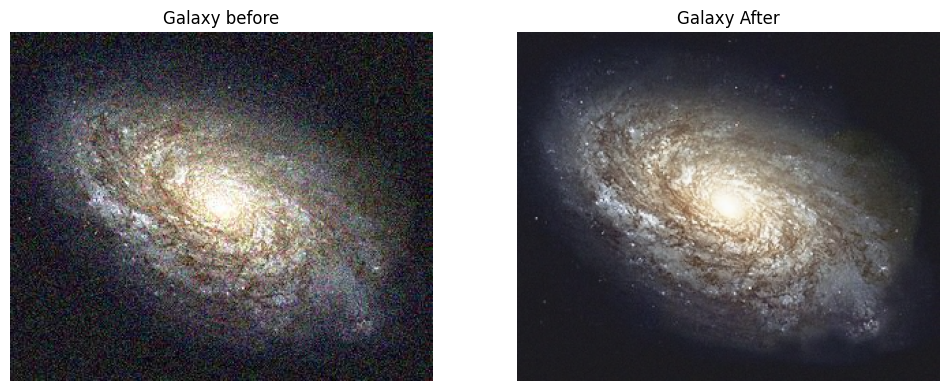

In [13]:
denoised_img = np.zeros(cv_img[0].shape)
jmlGambar = 80
for i in range(jmlGambar):
  denoised_img = denoised_img + cv_img[i]
denoised_img = np.uint16(denoised_img/jmlGambar)

psnr = PSNR(original_img,denoised_img)

print('Nilai PSNR dengan 80 citra : ', psnr, ' dB')
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(cv_img[0], cv2.COLOR_BGR2RGB))
plt.title('Galaxy before')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(denoised_img, cv2.COLOR_BGR2RGB))
plt.title('Galaxy After')
plt.axis('off')

plt.show()

Nilai PSNR dengan 100 citra :  19.92196095594035  dB


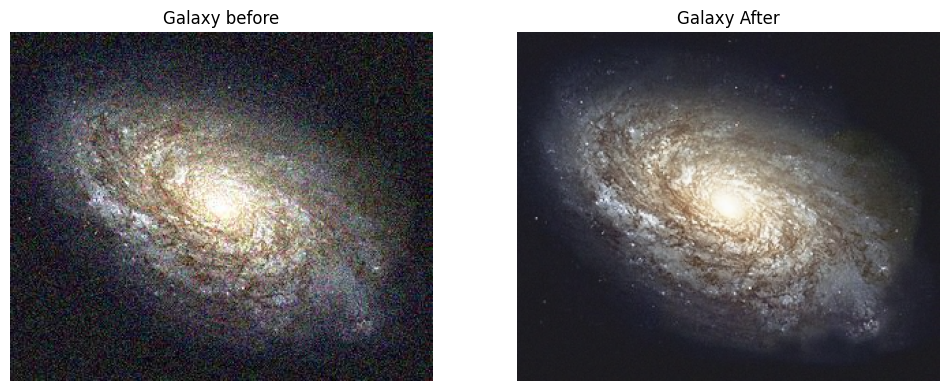

In [14]:
denoised_img = np.zeros(cv_img[0].shape)
jmlGambar = 100
for i in range(jmlGambar):
  denoised_img = denoised_img + cv_img[i]
denoised_img = np.uint16(denoised_img/jmlGambar)

psnr = PSNR(original_img,denoised_img)

print('Nilai PSNR dengan 100 citra : ', psnr, ' dB')
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(cv_img[0], cv2.COLOR_BGR2RGB))
plt.title('Galaxy before')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(denoised_img, cv2.COLOR_BGR2RGB))
plt.title('Galaxy After')
plt.axis('off')

plt.show()

**4. Buat image masking untuk image berikut.**

Image kiri adalah image asli (images/couple.tiff), sedangkan image paling kanan adalah hasilnya:

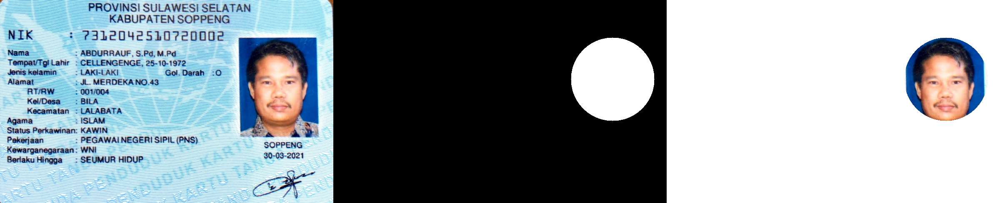

In [34]:
# menggunakan operator and
img = cv.imread('/content/drive/MyDrive/PCVK/Images/KTP.jpeg')
mask = np.zeros(img.shape,dtype=np.uint8)
mask = cv.circle(mask, (670,190), 100, (255,255,255), -1)

result = cv.bitwise_and(img, mask)
result[mask==0] = 255

final_frame = cv.hconcat((img,mask,result))
cv2_imshow(final_frame)

**5. Lakukan percobaan menggunakan operator lain dan tunjukkan hasilnya pada modul ini.**
Tuliskan hasil analisa anda kenapa citra keluarannya seperti itu.

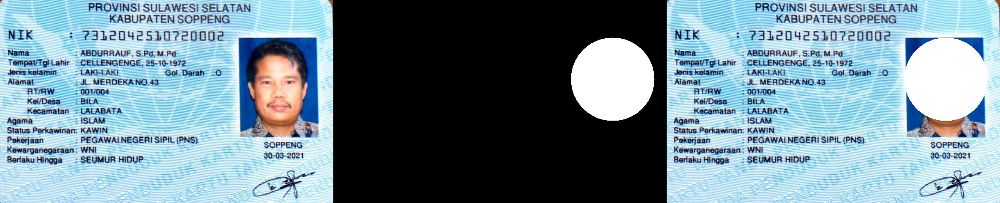

In [33]:
# menggunakan operator or
img = cv.imread('/content/drive/MyDrive/PCVK/Images/KTP.jpeg')
mask = np.zeros(img.shape,dtype=np.uint8)
mask = cv.circle(mask, (670,190), 100, (255,255,255), -1)

masked = cv.bitwise_or(img, mask)

final_frame = cv.hconcat((img, mask, masked))
cv2_imshow(final_frame)

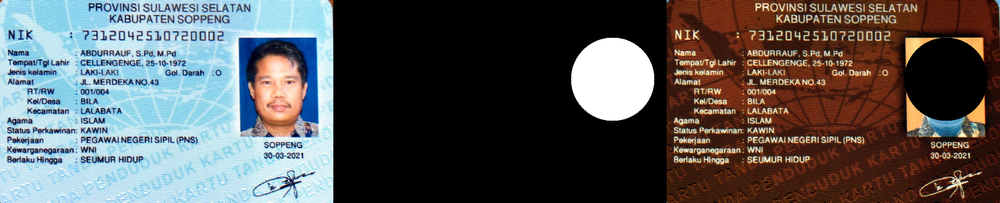

In [36]:
# menggunakan operator not
img = cv.imread('/content/drive/MyDrive/PCVK/Images/KTP.jpeg')
mask = np.zeros(img.shape,dtype=np.uint8)
mask = cv.circle(mask, (670,190), 100, (255,255,255), -1)

masked = ~img & ~mask

final_frame = cv.hconcat((img, mask, masked))
cv2_imshow(final_frame)

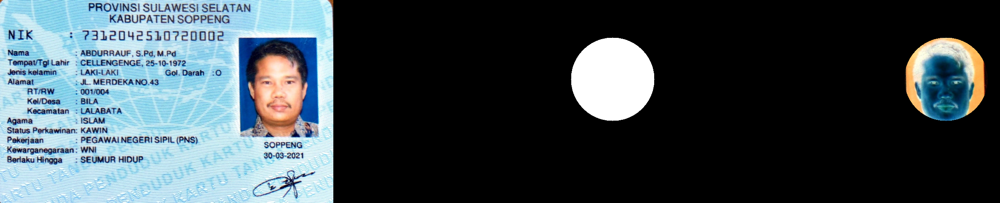

In [27]:
# menggunakan operator nand
img = cv.imread('/content/drive/MyDrive/PCVK/Images/KTP.jpeg')
mask = np.zeros(img.shape,dtype=np.uint8)
mask = cv.circle(mask, (670,190), 100, (255,255,255), -1)

masked = ~img & mask

final_frame = cv.hconcat((img, mask, masked))
cv2_imshow(final_frame)

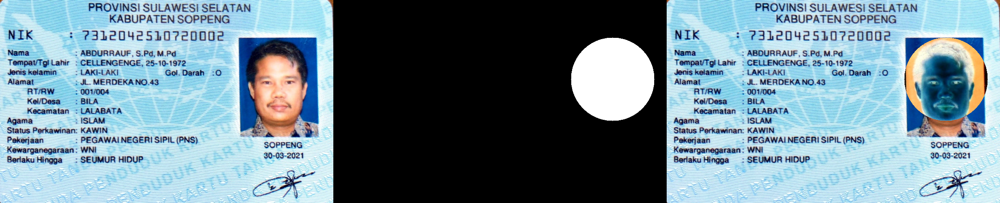

In [28]:
# menggunakan operator xor
img = cv.imread('/content/drive/MyDrive/PCVK/Images/KTP.jpeg')
mask = np.zeros(img.shape,dtype=np.uint8)
mask = cv.circle(mask, (670,190), 100, (255,255,255), -1)

masked = cv.bitwise_xor(img, mask)

final_frame = cv.hconcat((img, mask, masked))
cv2_imshow(final_frame)